![image](how.png)

**"Should I Stay or Should i Go (from the Hospital)"**

In [1]:
import pandas as pd
import numpy as np
from sklearn import linear_model
# la otra forma, pero lo mismo: from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
from sklearn import linear_model
from sklearn import model_selection
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import seaborn as sb
%matplotlib inline

In [3]:
df = pd.read_csv("/Users/Tomi/Desktop/my_git/dsbootcamp/week9/day5/competition/how-long-would-you-stay/train_set.csv")

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   0       100000 non-null  int64  
 1   1       100000 non-null  int64  
 2   2       100000 non-null  object 
 3   3       100000 non-null  int64  
 4   4       100000 non-null  object 
 5   5       100000 non-null  int64  
 6   6       100000 non-null  object 
 7   7       100000 non-null  object 
 8   8       100000 non-null  object 
 9   9       99967 non-null   float64
 10  10      100000 non-null  int64  
 11  11      98517 non-null   float64
 12  12      100000 non-null  object 
 13  13      100000 non-null  object 
 14  14      100000 non-null  int64  
 15  15      100000 non-null  object 
 16  16      100000 non-null  float64
 17  17      100000 non-null  object 
dtypes: float64(3), int64(6), object(9)
memory usage: 13.7+ MB


In [5]:
df.shape


(100000, 18)

In [6]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,161528,6,a,6,X,2,gynecology,R,F,4.0,45810,2.0,Urgent,Moderate,2,21-30,2817.0,0-10
1,159472,23,a,6,X,4,gynecology,Q,F,2.0,128565,15.0,Trauma,Moderate,4,51-60,4498.0,21-30
2,309765,2,c,5,Z,2,anesthesia,S,F,3.0,46565,5.0,Urgent,Moderate,2,71-80,4573.0,11-20
3,279614,32,f,9,Y,3,gynecology,S,B,4.0,124546,6.0,Emergency,Moderate,4,11-20,7202.0,51-60
4,147791,14,a,1,X,3,gynecology,S,E,2.0,22729,8.0,Urgent,Moderate,2,51-60,3398.0,51-60


In [7]:
df.columns = np.arange(len(df.columns))
df.head(1)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,161528,6,a,6,X,2,gynecology,R,F,4.0,45810,2.0,Urgent,Moderate,2,21-30,2817.0,0-10


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   0       100000 non-null  int64  
 1   1       100000 non-null  int64  
 2   2       100000 non-null  object 
 3   3       100000 non-null  int64  
 4   4       100000 non-null  object 
 5   5       100000 non-null  int64  
 6   6       100000 non-null  object 
 7   7       100000 non-null  object 
 8   8       100000 non-null  object 
 9   9       99967 non-null   float64
 10  10      100000 non-null  int64  
 11  11      98517 non-null   float64
 12  12      100000 non-null  object 
 13  13      100000 non-null  object 
 14  14      100000 non-null  int64  
 15  15      100000 non-null  object 
 16  16      100000 non-null  float64
 17  17      100000 non-null  object 
dtypes: float64(3), int64(6), object(9)
memory usage: 13.7+ MB


In [8]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
df[17] = le.fit_transform(df[17])
df.head(1)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,161528,6,a,6,X,2,gynecology,R,F,4.0,45810,2.0,Urgent,Moderate,2,21-30,2817.0,0


In [9]:
df[4] = le.fit_transform(df[4])
df[13] = le.fit_transform(df[13])
df[15] = le.fit_transform(df[15])
df[6] = le.fit_transform(df[6])
df.head(1)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,161528,6,a,6,0,2,2,R,F,4.0,45810,2.0,Urgent,2,2,2,2817.0,0


In [10]:
# PROBLEMA DE CLASIFICACIÓN
df[17].value_counts()

2     27452
1     24476
3     17311
5     10984
0      7427
4      3668
7      3297
10     2150
8      1470
9       908
6       857
Name: 17, dtype: int64

In [12]:
def encoder_serie(serie):
    encoder = {}
    for i, x in enumerate(serie):
        if not (x in encoder):
            encoder[x] = i
    serie = serie.map(encoder)
    return serie, encoder

In [11]:
# esto es necesario para evitar futuros errores pero si quitaráis las columnas con Nan no haría falta
# Nan no vale pero 0 sí
df = df.dropna()
# esto quita filas y por tanto no se lo podremos aplicar al dataset de predicción

In [12]:
# quitad la primera columna porque corresponde con el case_id y por tanto no le servirá al modelo para aprender...
# quitar otras columnas es decisión vuestra como futuros data scientists 
df.drop([0],1,inplace = True)

#### 1. Definir X e y

In [13]:
# coger las columnas 3, 4, 10, 11, 13, 15 para este modelo
X = np.array(df[[3, 4, 6, 10, 11, 13, 15]])
y = np.array(df[17])
X.shape

(98484, 7)

In [14]:
y.shape

(98484,)

#### 2. Dividir X_train, X_test, y_train, y_test

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [16]:
X_train

array([[ 9.,  1.,  2., ...,  8.,  1.,  5.],
       [ 5.,  2.,  2., ..., 21.,  1.,  2.],
       [ 7.,  1.,  2., ...,  8.,  2.,  3.],
       ...,
       [ 7.,  1.,  3., ...,  8.,  2.,  6.],
       [ 2.,  1.,  2., ...,  8.,  2.,  6.],
       [ 1.,  0.,  2., ...,  8.,  0.,  5.]])

#### 3. Asignar el modelo (vacío) a una variable
Aquí meteríais los parámetros

In [17]:
# KNN MODEL
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=6)
# Train the model using the training sets
model.fit(X_train, y_train)  # Memorize some trivial features between 'features' and 'label'

KNeighborsClassifier(n_neighbors=6)

#### 4. Entrenar el modelo con X_train, y_train

In [18]:
model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=6)

#### 4.1 GRAFICA DE VECINOS


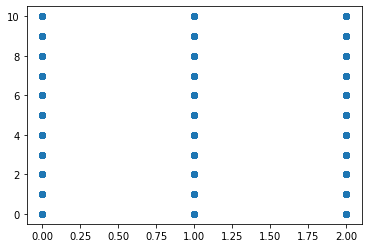

In [24]:
plt.scatter(df[4],df[17], alpha=0.5)

#### 5. Predecir con el modelo ya entrenado con X_test/to_pred

In [25]:
predictions = model.predict(X_test)
print(predictions)

[3 5 2 ... 2 5 1]


#### 6. Sacar métricas, valorar el modelo 

In [26]:
model.score(X_test,y_test)

0.23419810123369042

In [28]:
from sklearn import metrics
print("Accuracy:", metrics.accuracy_score(y_test, predictions))

Accuracy: 0.23419810123369042


## Una vez listo el modelo, toca predecir con el dataset de predicción 

In [29]:
to_pred = pd.read_csv("/Users/Tomi/Desktop/my_git/dsbootcamp/week9/day5/competition/how-long-would-you-stay/test_set.csv")

In [30]:
# la primera columna es id_case, deberéis quitarla para hacer la predicción si la habéis quitado para entrenar
# pero guardarla para incluirla en la submission

# IMPORTANTE: APLICAR LO MISMO A ESTOS DATOS QUE HAYÁIS APLICADO A LOS DATOS DE ENTRENAMIENTO
# SI EL ARRAY CON EL QUE HICISTEIS .fit() ERA DE 4 COLUMNAS, PARA .predict() DEBEN SER LAS MISMAS
# SI AL ARRAY CON EL QUE HICISTEIS .fit() LO NORMALIZASTEIS, PARA .predict() DEBÉIS NORMALIZARLO
# TODO IGUAL SALVO BORRAR FILAS, EL NÚMERO DE ROWS SE DEBE MANTENER EN ESTE SET, PUES LA PREDICCIÓN DEBE TENER 133744 FILAS
# SI O SI

to_pred.head(2)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,314114,19,a,7,Y,4,gynecology,S,C,2.0,59278,8.0,Emergency,Minor,2,41-50,4778.0
1,208989,15,c,5,Z,3,gynecology,S,F,2.0,102253,15.0,Trauma,Moderate,3,31-40,5734.0


In [31]:
to_pred.shape

(133744, 17)

In [32]:
# para evitar este error ValueError: Input contains NaN, infinity or a value too large for dtype('float64').
to_pred = to_pred.fillna(0)

In [33]:
to_pred['4'] = le.fit_transform(to_pred['4'])
to_pred['13'] = le.fit_transform(to_pred['13'])
to_pred['15'] = le.fit_transform(to_pred['15'])
to_pred['6'] = le.fit_transform(to_pred['6'])
to_pred.head(1)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,314114,19,a,7,1,4,2,S,C,2.0,59278,8.0,Emergency,1,2,4,4778.0


In [34]:
predictions_submit = model.predict(to_pred[['3', '4', '6', '10', '11', '13', '15']])
predictions_submit

array([0, 1, 2, ..., 2, 2, 2])

In [35]:
submission = pd.DataFrame({"id": to_pred["0"], "days": predictions_submit})
submission

,id,days
0,314114,0
1,208989,1
2,305872,2
3,266099,2
4,13228,2
...,...,...
133739,318155,1
133740,144850,2
133741,180676,2
133742,39933,2


In [36]:
sample = pd.read_csv("/Users/Tomi/Desktop/my_git/dsbootcamp/week9/day5/competition/how-long-would-you-stay/sample_submission.csv")

In [37]:
sample.shape

(133744, 2)

In [53]:
if submission.shape == sample.shape:
    if submission.columns.all() == sample.columns.all():
        if submission.id.all() == sample.id.all():
            print("you're ready to submit!")
            submission.to_csv("to_submit.csv", index = False)
            # ¡¡¡¡¡¡¡ADD INDEX = FALSE!!!!!!!!!

you're ready to submit!
